In [1]:
#from datasets import load_dataset
import torchvision.datasets
import torchvision.transforms as transforms
from PIL import Image
import torch.nn.functional as F
import os
from tqdm.notebook import tqdm
from tqdm import tqdm
import torch
import numpy as np
import torchvision.utils as vutils

/raid/home/kawinm/miniconda3/lib/python3.9/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
transform = transforms.Compose(
    [
        transforms.Resize(64),
        transforms.ToTensor(),
        transforms.Normalize(
            [0.5, 0.5, 0.5], [0.5, 0.5, 0.5]
        )
    ]
)

# Bitmoji
bitmoji = torchvision.datasets.ImageFolder(root='./data/bitmoji/', transform=transform)

In [3]:
# Splits data into batches of defined size
from torch.utils.data import DataLoader
from torch.utils.data.sampler import SubsetRandomSampler
import torch.nn as nn

DATASET = 'bitmoji' # or 'faces'

dataset = bitmoji
input_channel = 1
input_height  = 64
input_width   = 64

batch_size = 128

loader = DataLoader(dataset, batch_size, shuffle=True)

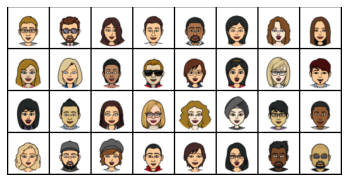

In [4]:
import matplotlib.pyplot as plt
%matplotlib inline

img = []
for idx, i in enumerate(dataset):
    if idx == 32:
        break
    img.append(i[0])

img_grid = torchvision.utils.make_grid(
    img, normalize = True
)

tensor_to_pil = transforms.ToPILImage()
plt.axis('off')
plt.imshow(tensor_to_pil(img_grid))

In [5]:
# Number of workers for dataloader
workers = 2

# Batch size during training
batch_size = 128

# Spatial size of training images. All images will be resized to this
#   size using a transformer.
image_size = 64

# Number of channels in the training images. For color images this is 3
nc = 3

# Size of z latent vector (i.e. size of generator input)
nz = 100

# Size of feature maps in generator
ngf = 64

# Size of feature maps in discriminator
ndf = 64

# Number of training epochs
num_epochs = 5

# Learning rate for optimizers
lr = 0.0002

# Beta1 hyperparam for Adam optimizers
beta1 = 0.5

# Number of GPUs available. Use 0 for CPU mode.
ngpu = 1

In [6]:
# custom weights initialization called on netG and netD
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

In [7]:
# Generator Code

class Generator(nn.Module):
    def __init__(self, ngpu):
        super(Generator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is Z, going into a convolution
            nn.ConvTranspose2d( nz, ngf * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            # state size. (ngf*8) x 4 x 4
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            # state size. (ngf*4) x 8 x 8
            nn.ConvTranspose2d( ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            # state size. (ngf*2) x 16 x 16
            nn.ConvTranspose2d( ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            # state size. (ngf) x 32 x 32
            nn.ConvTranspose2d( ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh()
            # state size. (nc) x 64 x 64
        )

    def forward(self, input):
        return self.main(input)

In [8]:
# Create the generator
device = torch.device('cuda:2')
ngpu = 1

netG = Generator(ngpu).to(device)


# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    netG = nn.DataParallel(netG, list(range(ngpu)))

# Apply the weights_init function to randomly initialize all weights
#  to mean=0, stdev=0.02.
netG.apply(weights_init)

# Print the model
print(netG)

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)


In [9]:
class Discriminator(nn.Module):
    def __init__(self, ngpu):
        super(Discriminator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is (nc) x 64 x 64
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf) x 32 x 32
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*2) x 16 x 16
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*4) x 8 x 8
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*8) x 4 x 4
            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False)
        )

    def forward(self, input):
        return self.main(input)

In [10]:
# Create the Discriminator
netD = Discriminator(ngpu).to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    netD = nn.DataParallel(netD, list(range(ngpu)))

# Apply the weights_init function to randomly initialize all weights
#  to mean=0, stdev=0.2.
netD.apply(weights_init)

# Print the model
print(netD)

Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
  )
)


In [11]:
# Initialize BCELoss function
criterion = nn.MSELoss()

# Create batch of latent vectors that we will use to visualize
#  the progression of the generator
fixed_noise = torch.randn(64, nz, 1, 1, device=device)

# Establish convention for real and fake labels during training
real_label = 1.
fake_label = 0.

# Setup Adam optimizers for both G and D
optimizerD = torch.optim.Adam(netD.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerG = torch.optim.Adam(netG.parameters(), lr=lr, betas=(beta1, 0.999))

In [12]:
# Training Loop

# Lists to keep track of progress
img_list = []
G_losses = []
D_losses = []
iters = 0
num_epochs = 5

print("Starting Training Loop...")
# For each epoch
for epoch in range(num_epochs):
    # For each batch in the dataloader
    for i, data in enumerate(loader, 0):

        ############################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################
        ## Train with all-real batch
        netD.zero_grad()
        # Format batch
        real_cpu = data[0].to(device)
        b_size = real_cpu.size(0)
        label = torch.full((b_size,), real_label, dtype=torch.float, device=device)
        # Forward pass real batch through D
        output = netD(real_cpu).view(-1)
        # Calculate loss on all-real batch
        errD_real = criterion(output, label)
        # Calculate gradients for D in backward pass
        errD_real.backward()
        D_x = output.mean().item()

        ## Train with all-fake batch
        # Generate batch of latent vectors
        noise = torch.randn(b_size, nz, 1, 1, device=device)
        # Generate fake image batch with G
        fake = netG(noise)
        label.fill_(fake_label)
        # Classify all fake batch with D
        output = netD(fake.detach()).view(-1)
        # Calculate D's loss on the all-fake batch
        errD_fake = criterion(output, label)
        # Calculate the gradients for this batch, accumulated (summed) with previous gradients
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        # Compute error of D as sum over the fake and the real batches
        errD = errD_real + errD_fake
        # Update D
        optimizerD.step()

        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        netG.zero_grad()
        label.fill_(real_label)  # fake labels are real for generator cost
        # Since we just updated D, perform another forward pass of all-fake batch through D
        output = netD(fake).view(-1)
        # Calculate G's loss based on this output
        errG = criterion(output, label)
        # Calculate gradients for G
        errG.backward()
        D_G_z2 = output.mean().item()
        # Update G
        optimizerG.step()

        # Output training stats
        if i % 50 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, num_epochs, i, len(loader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))

        # Save Losses for plotting later
        G_losses.append(errG.item())
        D_losses.append(errD.item())

        # Check how the generator is doing by saving G's output on fixed_noise
        if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(loader)-1)):
            with torch.no_grad():
                fake = netG(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

        iters += 1

Starting Training Loop...
[0/5][0/1018]	Loss_D: 2.8174	Loss_G: 0.2679	D(x): 0.4718	D(G(z)): 0.0958 / 0.7631
[0/5][50/1018]	Loss_D: 5.8109	Loss_G: 11.8551	D(x): 0.4508	D(G(z)): -2.2206 / 4.3976
[0/5][100/1018]	Loss_D: 8.1533	Loss_G: 19.4551	D(x): 1.4555	D(G(z)): 2.7119 / -3.3957
[0/5][150/1018]	Loss_D: 0.3435	Loss_G: 2.5543	D(x): 1.1853	D(G(z)): 0.2413 / 2.5745
[0/5][200/1018]	Loss_D: 0.5689	Loss_G: 0.6263	D(x): 0.6646	D(G(z)): -0.4333 / 0.2925
[0/5][250/1018]	Loss_D: 6.4523	Loss_G: 0.5331	D(x): -0.6568	D(G(z)): -1.8184 / 0.3086
[0/5][300/1018]	Loss_D: 0.2948	Loss_G: 3.0594	D(x): 0.8580	D(G(z)): 0.3486 / -0.7331
[0/5][350/1018]	Loss_D: 0.8004	Loss_G: 5.0811	D(x): 1.3592	D(G(z)): 0.7498 / -1.2473
[0/5][400/1018]	Loss_D: 3.9642	Loss_G: 0.7565	D(x): -0.2675	D(G(z)): -1.4886 / 1.8515
[0/5][450/1018]	Loss_D: 1.1500	Loss_G: 0.0305	D(x): 0.2641	D(G(z)): -0.7308 / 1.0785
[0/5][500/1018]	Loss_D: 0.0903	Loss_G: 1.2628	D(x): 0.9049	D(G(z)): 0.1519 / -0.1184
[0/5][550/1018]	Loss_D: 0.0640	Loss_G: 0

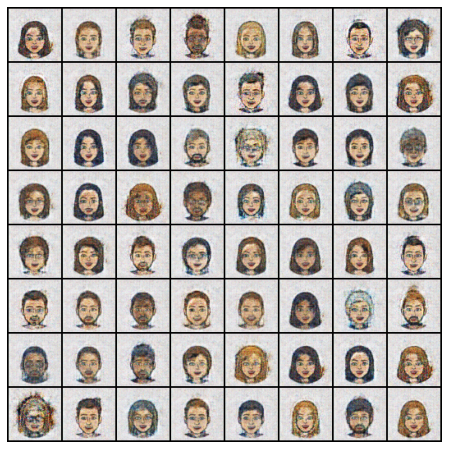

In [13]:
import matplotlib.animation as animation
from IPython.display import HTML

fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

FileNotFoundError: [Errno 2] No such file or directory: '/raid/home/kawinm/adrl/traversal/lsgan_grid.png'

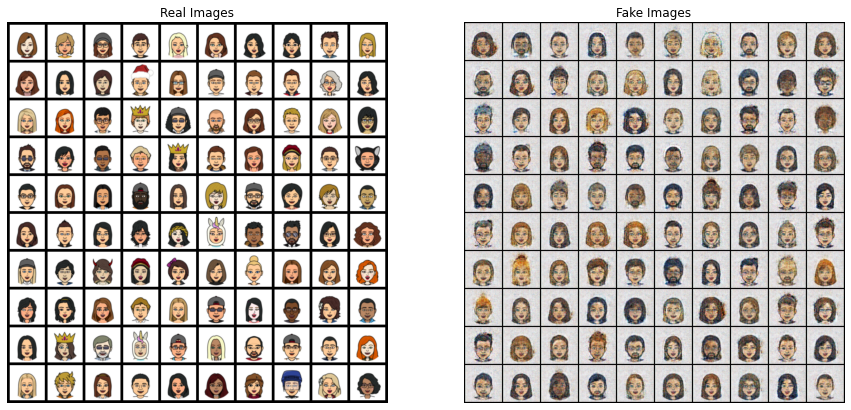

In [14]:
# Grab a batch of real images from the dataloader
real_batch = next(iter(loader))

# Plot the real images
plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:100], padding=5, nrow=10, normalize=True).cpu(),(1,2,0)))

fixed_noise = torch.randn(100, nz, 1, 1, device=device)
fake = netG(fixed_noise).detach().cpu()
            
# Plot the fake images from the last epoch
plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(vutils.make_grid(fake, padding=2,nrow=10, normalize=True),(1,2,0)))
plt.savefig("/raid/home/kawinm/adrl/traversal/lsgan_grid.png", dpi=300)

In [ ]:
noise_list = []
for k in range(2):
    fixed_noise = torch.randn(100, nz, 1, 1, device=device)
    noise_list.append(fixed_noise)
    fake = netG(fixed_noise).detach().cpu()

    plt.imshow(np.transpose(vutils.make_grid(fake, normalize=True, nrow = 10).cpu(),(1,2,0)))
    plt.savefig("/raid/home/kawinm/adrl/traversal/traverse_lsgan{t}.png".format(t=k), dpi=300)

fake = netG(noise_list[0] + noise_list[1]).detach().cpu()

plt.imshow(np.transpose(vutils.make_grid(fake, normalize=True, nrow = 10).cpu(),(1,2,0)))
plt.savefig("/raid/home/kawinm/adrl/traversal/traverse_lsgan_3.png", dpi=300)

    

In [ ]:
i=0
for xb in loader:
    real_cpu = xb[0].to(device)
    fixed_noise = torch.randn(128, nz, 1, 1, device=device)
    fake = netG(fixed_noise).detach().cpu()
    for batch in range(len(real_cpu[0])):
        plt.imshow(np.transpose(vutils.make_grid(real_cpu[batch], normalize=True).cpu(),(1,2,0)))
        plt.savefig("/raid/home/kawinm/adrl/LS_Gan_real/real{a}.png".format(a=i))
        plt.imshow(np.transpose(vutils.make_grid(fake[batch], normalize=True).cpu(),(1,2,0)))
        plt.savefig("/raid/home/kawinm/adrl/LS_Gan_fake/fake{a}.png".format(a=i))
    i+=1
    if(i==100):
        break

# FID:  172.43639597130795

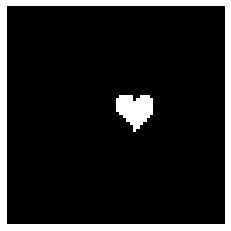

In [54]:
plt.axis('off')
plt.imshow(tensor_to_pil(xb.cpu().detach().numpy().transpose(1,2,0).astype(np.uint8)), cmap="gray")

In [ ]:
z = torch.randn(1, 10, 14, 12).to(device)
xb_dash = model.decoder(z)

print(xb_dash.shape)
xb_dash = xb_dash[0] * 255
tensor_to_pil = transforms.ToPILImage()
plt.imshow(tensor_to_pil(xb_dash.cpu().detach().numpy().transpose(1,2,0).astype(np.uint8)),interpolation="nearest")

In [ ]:
# https://adamcobb.github.io/journal/hamiltorch.html

In [ ]:
netG = Generator(ngpu).to(device)
# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    netG = nn.DataParallel(netG, list(range(ngpu)))
netG.apply(weights_init)
# Print the model
print(netG)